# Detection of Earthquake-Induced Landslides Using Unsupervised Learning
Landslides are destructive natural hazards, often triggered by earthquakes or intense rainfall, and pose serious risks to infrastructure and human life. Rapid detection of landslide-affected areas is therefore essential for post-disaster assessment and hazard modelling. This project focuses on a site southeast of the epicentre of the 5 September 2022 Mw 6.6 Luding earthquake in China, which triggered over 5,000 landslides (Ding and Wang, 2025). The selected region offers minimal cloud cover in both pre- and post-earthquake Sentinel-2 imagery, enabling clear optical analysis.

Sentinel-2 provides high-resolution multispectral data ideal for mapping vegetation loss via indices such as the Normalised Difference Vegetation Index (NDVI). Although NDVI is commonly used for landslide detection, its traditional threshold-based approach requires prior knowledge of vegetation conditions. To overcome this, the project applies unsupervised learning, specifically K-means and Gaussian Mixture Models (GMM), to evaluate whether landslide scars can be reliably detected without predefined thresholds or local environmental knowledge.

## Preparation

Install the necessary packages

In [1]:
! pip install rasterio
! pip install codecarbon

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 576.4/576.4 kB 29.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.0/278.0 kB 22.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 27.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.4/76.4 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.5/92.5 kB 6.4 MB/s eta 0:00:00
  Attempting uninstall: termcolor
    Found existing installation: termcolor 3.1.0
    Uninstalling termcolor-3.1.0:
      Successfully uninstalled termcolor-3.1.0
  Attempting uninstall: psutil
    Found existing installation: psutil 5.9.5
    Uninstalling psutil-5.9.5:
      Successfully uninstalled psutil-5.9.5
  Attempting uninstall: httpx
    Found existing installation: httpx 0.28.1
    Uninstalling httpx-0.28.1:
      Successfully uninst

**Restart the Runtime to use the codecarbon**

Start the emission tracker.

In [2]:
from codecarbon import EmissionsTracker

tracker = EmissionsTracker(project_name="Landslide_Detection")
tracker.start()

[codecarbon WARNING @ 14:34:57] Multiple instances of codecarbon are allowed to run at the same time.
[codecarbon INFO @ 14:34:57] [setup] RAM Tracking...
[codecarbon INFO @ 14:34:57] [setup] CPU Tracking...
[codecarbon WARNING @ 14:34:58] We saw that you have a Intel(R) Xeon(R) CPU @ 2.20GHz but we don't know it. Please contact us.
[codecarbon WARNING @ 14:34:58] No CPU tracking mode found. Falling back on estimation based on TDP for CPU. 
 Linux OS detected: Please ensure RAPL files exist at /sys/class/powercap/intel-rapl/subsystem to measure CPU

[codecarbon INFO @ 14:34:58] CPU Model on constant consumption mode: Intel(R) Xeon(R) CPU @ 2.20GHz
[codecarbon WARNING @ 14:34:58] No CPU tracking mode found. Falling back on CPU constant mode.
[codecarbon INFO @ 14:34:58] [setup] GPU Tracking...
[codecarbon INFO @ 14:34:58] No GPU found.
[codecarbon INFO @ 14:34:58] The below tracking methods have been set up:
                RAM Tracking Method: RAM power estimation model
               

Import all the required packages and mount to google drive.

In [ ]:
import os
import requests
from datetime import datetime, timedelta
import numpy as np
import pandas as pd
import rasterio
from rasterio.mask import mask
from shapely.geometry import Polygon, Point, box, mapping
from pyproj import Proj, Transformer
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import cv2
import seaborn as sns

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Data Fetching
**The downloaded file will be a zip file. Unzip the file in the directory where you saved it to access the data.**

Define the functions for downloading the data.

In [2]:
def make_api_request(url, method="GET", data=None, headers=None):
    global access_token
    if not headers:
        headers = {"Authorization": f"Bearer {access_token}"}

    response = requests.request(method, url, json=data, headers=headers)
    if response.status_code in [401, 403]:
        global refresh_token
        access_token = refresh_access_token(refresh_token)
        headers["Authorization"] = f"Bearer {access_token}"
        response = requests.request(method, url, json=data, headers=headers)
    return response


def query_sentinel2_luding_data(start_date, end_date, token):
    """
    Queries Sentinel-3 OLCI data within a specified time range from the Copernicus Data Space,
    targeting data collected over the Arctic region.

    Parameters:
    start_date (str): Start date in 'YYYY-MM-DD' format.
    end_date (str): End date in 'YYYY-MM-DD' format.
    token (str): Access token for authentication.

    Returns:
    DataFrame: Contains details about the Sentinel-3 OLCI images.
    """

    all_data = []
    luding_polygon = (
        "POLYGON ((102.1844 29.4993, 102.1844 29.679, 102.3908 29.679, 102.3908 29.4993, 102.1844 29.4993))"
        )

    filter_string = (
        f"Collection/Name eq 'SENTINEL-2' and "
        f"Attributes/OData.CSC.StringAttribute/any(att:att/Name eq 'productType' and att/Value eq 'S2MSI2A') and "
        f"ContentDate/Start gt {start_date}T00:00:00.000Z and ContentDate/Start lt {end_date}T23:59:59.999Z"
    )

    next_url = (
        f"https://catalogue.dataspace.copernicus.eu/odata/v1/Products?"
        f"$filter={filter_string} and "
        f"OData.CSC.Intersects(area=geography'SRID=4326;{luding_polygon}')&"
        f"$top=1000"
    )

    headers = {"Authorization": f"Bearer {token}"}

    while next_url:
        response = make_api_request(next_url, headers=headers)
        if response.status_code == 200:
            data = response.json()["value"]
            all_data.extend(data)
            next_url = response.json().get("@odata.nextLink")
        else:
            print(f"Error fetching data: {response.status_code} - {response.text}")
            break

    return pd.DataFrame(all_data)


def get_access_and_refresh_token(username, password):
    """Retrieve both access and refresh tokens."""
    url = "https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token"
    data = {
        "grant_type": "password",
        "username": username,
        "password": password,
        "client_id": "cdse-public",
    }
    response = requests.post(url, data=data)
    response.raise_for_status()
    tokens = response.json()
    return tokens["access_token"], tokens["refresh_token"]


def refresh_access_token(refresh_token):
    """Attempt to refresh the access token using the refresh token."""
    url = "https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token"
    data = {
        "grant_type": "refresh_token",
        "refresh_token": refresh_token,
        "client_id": "cdse-public",
    }
    headers = {"Content-Type": "application/x-www-form-urlencoded"}
    try:
        response = requests.post(url, headers=headers, data=data)
        response.raise_for_status()  # This will throw an error for non-2xx responses
        return response.json()["access_token"]
    except requests.exceptions.HTTPError as e:
        print(f"Failed to refresh token: {e.response.status_code} - {e.response.text}")
        if e.response.status_code == 400:
            print("Refresh token invalid, attempting re-authentication...")
            # Attempt to re-authenticate
            username = username
            password = password
            # This requires securely managing the credentials, which might not be feasible in all contexts
            access_token, new_refresh_token = get_access_and_refresh_token(
                username, password
            )  # This is a placeholder
            refresh_token = (
                new_refresh_token  # Update the global refresh token with the new one
            )
            return access_token
        else:
            raise

def download_single_product(
    product_id, file_name, access_token, download_dir="downloaded_products"
):
    """
    Download a single product from the Copernicus Data Space.

    :param product_id: The unique identifier for the product.
    :param file_name: The name of the file to be downloaded.
    :param access_token: The access token for authorization.
    :param download_dir: The directory where the product will be saved.
    """
    # Ensure the download directory exists
    os.makedirs(download_dir, exist_ok=True)

    # Construct the download URL
    url = (
        f"https://zipper.dataspace.copernicus.eu/odata/v1/Products({product_id})/$value"
    )

    # Set up the session and headers
    headers = {"Authorization": f"Bearer {access_token}"}
    session = requests.Session()
    session.headers.update(headers)

    # Perform the request
    response = session.get(url, headers=headers, stream=True)

    # Check if the request was successful
    if response.status_code == 200:
        # Define the path for the output file
        output_file_path = os.path.join(download_dir, file_name + ".zip")

        # Stream the content to a file
        with open(output_file_path, "wb") as file:
            for chunk in response.iter_content(chunk_size=8192):
                if chunk:
                    file.write(chunk)
        print(f"Downloaded: {output_file_path}")
    else:
        print(
            f"Failed to download product {product_id}. Status Code: {response.status_code}"
        )

Use the functions above to fetch the data of areas affected by the Luding Earthquake.

In [4]:
# --- Authenticate with Copernicus Data Space ---
username = "your_username" # Change to your username
password = "your_password" # Change to your password
access_token, refresh_token = get_access_and_refresh_token(username, password)

# --- Define Time Ranges for Pre- and Post-earthquake ---
pre_eq_start_date = "2021-11-05"
pre_eq_end_date = "2021-11-06"
post_eq_start_date = "2022-11-20"
post_eq_end_date = "2022-11-21"

# --- Query Sentinel-2 Products Covering 2022 Luding Earthquake Affected Area ---
pre_eq_sentinel2_data = query_sentinel2_luding_data(
    pre_eq_start_date, pre_eq_end_date, access_token
)

post_eq_sentinel2_data = query_sentinel2_luding_data(
    post_eq_start_date, post_eq_end_date, access_token
)

# --- Download the Selected Sentinel-2 Product for Each Time Range ---
download_dir = "/content/drive/MyDrive/GEOL0069_AI4EO/Final_Project/"  # Define download directory

# --- Download Pre-Earthquake Product ---
product_id = pre_eq_sentinel2_data['Id'][0]
file_name = pre_eq_sentinel2_data['Name'][0]
download_single_product(product_id, file_name, access_token, download_dir)

# --- Download Post-Earthquake Product ---
product_id = post_eq_sentinel2_data['Id'][0]
file_name = post_eq_sentinel2_data['Name'][0]
download_single_product(product_id, file_name, access_token, download_dir)

Downloaded: /content/drive/MyDrive/GEOL0069_AI4EO/Final_Project/S2A_MSIL2A_20211105T034941_N0500_R104_T48RTT_20230101T030102.SAFE.zip
Downloaded: /content/drive/MyDrive/GEOL0069_AI4EO/Final_Project/S2A_MSIL2A_20221120T035041_N0400_R104_T48RTT_20221120T075354.SAFE.zip


## Align the Pre- and Post-Earthquake Images
**Since the two Sentinel-2 data files are one year apart, pixel-by-pixel analysis for landslide scar detection requires proper spatial alignment. To achieve this, Enhanced Correlation Coefficient (ECC) alignment was applied.**

Define the functions needed for applying the ECC alignment.

In [5]:
def crop_sentinel2_bands(bands_paths: dict, bbox_wgs84: box, band_order: list):
    cropped_bands = []
    transform_out = None
    crs_out = None
    for band_key in band_order:
        with rasterio.open(bands_paths[band_key]) as src:
            if src.crs.to_string() != 'EPSG:4326':
                transformer = Transformer.from_crs("EPSG:4326", src.crs, always_xy=True)
                minx, miny = transformer.transform(*bbox_wgs84.bounds[0:2])
                maxx, maxy = transformer.transform(*bbox_wgs84.bounds[2:4])
                geom = [mapping(box(minx, miny, maxx, maxy))]
            else:
                geom = [mapping(bbox_wgs84)]
            out_img, out_transform = mask(src, geom, crop=True)
            cropped_bands.append(out_img[0])
            transform_out = out_transform
            crs_out = src.crs
    return np.dstack(cropped_bands), transform_out, crs_out

def estimate_ecc_euclidean(ref_band, mov_band, num_iterations=5000, termination_eps=1e-8):
    ref_f = ref_band.astype(np.float32) / max(1, ref_band.max())
    mov_f = mov_band.astype(np.float32) / max(1, mov_band.max())
    warp_matrix = np.eye(2, 3, dtype=np.float32)
    criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, num_iterations, termination_eps)
    cc, warp_matrix = cv2.findTransformECC(
        templateImage=ref_f,
        inputImage=mov_f,
        warpMatrix=warp_matrix,
        motionType=cv2.MOTION_EUCLIDEAN,
        criteria=criteria
    )
    return warp_matrix, cc

def warp_stack(stack, warp_matrix, dsize):
    H, W = dsize
    warped_bands = []
    for i in range(stack.shape[2]):
        band = stack[:, :, i]
        warped = cv2.warpAffine(
            band,
            warp_matrix,
            (W, H),
            flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP,
            borderMode=cv2.BORDER_CONSTANT,
            borderValue=0
        )
        warped_bands.append(warped)
    return np.dstack(warped_bands)

def apply_fixed_normalization(arr, vmin, vmax):
    return np.clip((arr - vmin) / (vmax - vmin), 0, 1)

Since this project used short-wave infrared, near-infrared, and RGB bands, a spatial resolution of 20 m was adopted to ensure consistency across all bands, as the 10 m resolution does not include short-wave infrared data. ECC alignment was applied to the post-earthquake image using the pre-earthquake image as the reference. Because the data structure involved rotation, a buffered region of interest was first defined, followed by cropping a smaller subset that excluded glacier and water areas for simplicity.

In [6]:
# --- Define the Initial Region of Interest with Buffer ---
buffer = 0.02
bbox = box(102.08-buffer, 29.5-buffer, 102.17+buffer, 29.59+buffer)

# --- Define Band Paths ---
path = '/content/drive/MyDrive/GEOL0069_AI4EO/Final_Project/'

base_pre = (
    "S2A_MSIL2A_20211105T034941_N0500_R104_T48RTT_20230101T030102.SAFE/GRANULE/L2A_T48RTT_A033277_20211105T035710/IMG_DATA/R20m/"
)
bands_paths_pre = {
    'B11': path + base_pre + 'T48RTT_20211105T034941_B11_20m.jp2',
    'B8': path + base_pre + 'T48RTT_20211105T034941_B8A_20m.jp2',
    'B4': path + base_pre + 'T48RTT_20211105T034941_B04_20m.jp2',
    'B3': path + base_pre + 'T48RTT_20211105T034941_B03_20m.jp2',
    'B2': path + base_pre + 'T48RTT_20211105T034941_B02_20m.jp2'
}

base_post = (
    "S2A_MSIL2A_20221120T035041_N0400_R104_T47RQN_20221120T075354.SAFE/GRANULE/L2A_T47RQN_A038711_20221120T035143/IMG_DATA/R20m/"
)
bands_paths_post = {
    'B11': path + base_post + 'T47RQN_20221120T035041_B11_20m.jp2',
    'B8': path + base_post + 'T47RQN_20221120T035041_B8A_20m.jp2',
    'B4': path + base_post + 'T47RQN_20221120T035041_B04_20m.jp2',
    'B3': path + base_post + 'T47RQN_20221120T035041_B03_20m.jp2',
    'B2': path + base_post + 'T47RQN_20221120T035041_B02_20m.jp2'
}

# --- Define Bands & Crop Buffered ROI ---
all_bands = ['B11','B8', 'B4', 'B3', 'B2']
all_pre_raw, _, _  = crop_sentinel2_bands(bands_paths_pre,  bbox, all_bands)
all_post_raw, _, _ = crop_sentinel2_bands(bands_paths_post, bbox, all_bands)

# --- Estimate Warp & Apply ---
warp_mat, cc_val = estimate_ecc_euclidean(all_pre_raw[..., 0], all_post_raw[..., 0])
print(f"ECC‐Euclidean converged, CC = {cc_val:.4f}")
H, W = all_pre_raw.shape[:2]
all_post_aligned = warp_stack(all_post_raw, warp_mat, (H, W))

# --- Crop to Fixed Pixel Window ---
x_min, x_max = 150, 450
y_min, y_max = 250, 600
all_pre_raw = all_pre_raw[y_min:y_max, x_min:x_max, :]
all_post_aligned = all_post_aligned[y_min:y_max, x_min:x_max, :]

# --- Crop the Original Unaligned Post-EQ to Same Window for Illustration ---
all_post_unaligned = all_post_raw[y_min:y_max, x_min:x_max, :]

# --- Create Valid-Data Masks ---
valid_pre_mask = np.all(all_pre_raw > 0, axis=2)
valid_post_mask = np.all(all_post_aligned > 0, axis=2)
valid_unaligned_mask = np.all(all_post_unaligned > 0, axis=2)

ECC‐Euclidean converged, CC = 0.6565


Plot the true-colour images of the pre-earthquake, unaligned post-earthquake, and aligned post-earthquake regions of interest (ROI).

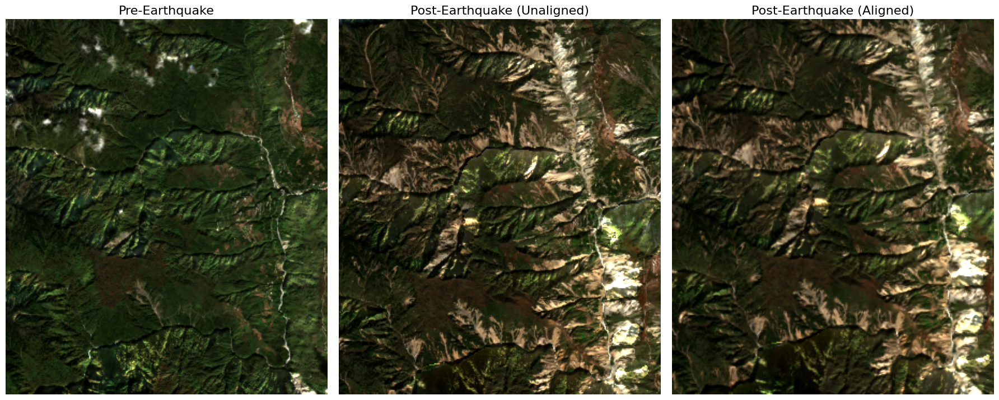

In [7]:
# --- Plotting the RGB Images ---
rgb_pre = all_pre_raw[:, :, -3:]
rgb_unaligned_post = all_post_unaligned[:, :, -3:]
rgb_aligned_post = all_post_aligned[:, :, -3:]

vmin = np.percentile(rgb_aligned_post, 2)
vmax = np.percentile(rgb_aligned_post, 99)

rgb_pre_norm = apply_fixed_normalization(rgb_pre, vmin, vmax)
rgb_unaligned = apply_fixed_normalization(rgb_unaligned_post, vmin, vmax)
rgb_aligned = apply_fixed_normalization(rgb_aligned_post, vmin, vmax)

rgb_pre_norm[~valid_pre_mask] = 0
rgb_unaligned[~valid_unaligned_mask] = 0
rgb_aligned[~valid_post_mask] = 0

fig, axes = plt.subplots(1, 3, figsize=(18, 7))
axes[0].imshow(rgb_pre_norm)
axes[0].set_title("Pre-Earthquake",fontsize=16)
axes[0].axis('off')

axes[1].imshow(rgb_unaligned)
axes[1].set_title("Post-Earthquake (Unaligned)",fontsize=16)
axes[1].axis('off')

axes[2].imshow(rgb_aligned)
axes[2].set_title("Post-Earthquake (Aligned)",fontsize=16)
axes[2].axis('off')

plt.tight_layout()
#plt.savefig(path + 'Figure/RGB_pre_post_aligned_EQ.jpg', dpi=300, bbox_inches='tight')
plt.show()

## Create a NDVI Mask
**To determine the landslide scar, the Normalised Difference Vegetation Index (NDVI) was used. This index utilises the near-infrared and red bands to assess vegetation density. By comparing NDVI values before and after the earthquake, the landslide scar could be approximated. The Bare Soil Index (BSI) was also calculated in this section for later use in clustering analysis.**

Calculate the NDVI and BSI before and after the earthquake, and use the difference in NDVI to generate a landslide scar mask.

In [8]:
# --- Define Threshold Value ---
ndvi_threshold = 0.15

# --- Convert Bands to Float for Safe Division (Pre-Earthquake) ---
swir_pre = all_pre_raw[:, :, 0].astype(np.float32)
nir_pre = all_pre_raw[:, :, 1].astype(np.float32)
red_pre = all_pre_raw[:, :, 2].astype(np.float32)
green_pre = all_pre_raw[:, :, 3].astype(np.float32)
blue_pre = all_pre_raw[:, :, 4].astype(np.float32)

# --- NDVI Calculation (Pre-Earthquake) ---
den_ndvi_pre = nir_pre + red_pre
ndvi_pre = np.zeros_like(den_ndvi_pre, dtype=np.float32)
valid_ndvi_pre = den_ndvi_pre != 0
ndvi_pre[valid_ndvi_pre] = (nir_pre[valid_ndvi_pre] - red_pre[valid_ndvi_pre]) / den_ndvi_pre[valid_ndvi_pre]

# --- NDVI Mask (Pre-Earthquake) ---
mask_ndvi_pre = (ndvi_pre > ndvi_threshold).astype(np.uint8)

# --- BSI Calculation (Pre-Earthquake) ---
num_bsi_pre = (swir_pre + red_pre) - (nir_pre + blue_pre)
den_bsi_pre = (swir_pre + red_pre) + (nir_pre + blue_pre)
bsi_pre = np.zeros_like(den_bsi_pre, dtype=np.float32)
valid_bsi_pre = den_bsi_pre != 0
bsi_pre[valid_bsi_pre] = num_bsi_pre[valid_bsi_pre] / den_bsi_pre[valid_bsi_pre]

# --- Convert Bands to Float for Safe Division (Post-Earthquake) ---
swir_post = all_post_aligned[:, :, 0].astype(np.float32)
nir_post = all_post_aligned[:, :, 1].astype(np.float32)
red_post = all_post_aligned[:, :, 2].astype(np.float32)
green_post = all_post_aligned[:, :, 3].astype(np.float32)
blue_post = all_post_aligned[:, :, 4].astype(np.float32)

# --- NDVI Calculation (Post-Earthquake) ---
den_ndvi_post = nir_post + red_post
ndvi_post = np.zeros_like(den_ndvi_post, dtype=np.float32)
valid_ndvi_post = den_ndvi_post != 0
ndvi_post[valid_ndvi_post] = (nir_post[valid_ndvi_post] - red_post[valid_ndvi_post]) / den_ndvi_post[valid_ndvi_post]

# --- NDVI Mask (Post-Earthquake) ---
mask_ndvi_post = (ndvi_post > ndvi_threshold).astype(np.uint8)

# --- BSI Calculation (Post-Earthquake) ---
num_bsi_post = (swir_post + red_post) - (nir_post + blue_post)
den_bsi_post = (swir_post + red_post) + (nir_post + blue_post)
bsi_post = np.zeros_like(den_bsi_post, dtype=np.float32)
valid_bsi_post = den_bsi_post != 0
bsi_post[valid_bsi_post] = num_bsi_post[valid_bsi_post] / den_bsi_post[valid_bsi_post]

# --- NDVI Landslide Mask ---
ndvi_diff = ndvi_post - ndvi_pre
landslide_mask = ((ndvi_diff < -0.2) & (ndvi_pre > ndvi_threshold)).astype(np.uint8)

Plot the NDVI and the landslide mask.

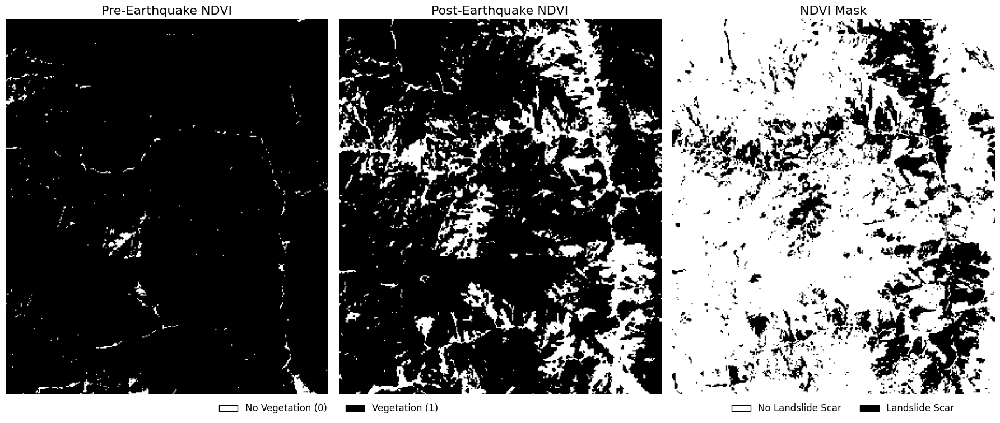

In [9]:
# --- Create Legend for Binary NDVI Mask ---
ndvi_patches = [
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0), edgecolor='black'),
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0.99), edgecolor='black'),
]
ndvi_labels = ['No Vegetation (0)', 'Vegetation (1)']

scar_patches = [
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0), edgecolor='black'),
    Rectangle((0, 0), 1, 1, facecolor='black', edgecolor='black')
]
scar_labels = ['No Landslide Scar', 'Landslide Scar']

# --- Plot the Result ---
fig, axes = plt.subplots(1, 3, figsize=(18, 7))

axes[0].imshow(mask_ndvi_pre, cmap="binary")
axes[0].set_title("Pre-Earthquake NDVI", fontsize = 16)
axes[0].axis('off')

axes[1].imshow(mask_ndvi_post, cmap="binary")
axes[1].set_title("Post-Earthquake NDVI", fontsize = 16)
axes[1].axis('off')

axes[2].imshow(landslide_mask, cmap="binary")
axes[2].set_title("NDVI Mask", fontsize = 16)
axes[2].axis('off')

# --- Add Legend Below First Two Plots ---
fig.legend(
    handles=ndvi_patches,
    labels=ndvi_labels,
    loc='lower center',
    ncol=2,
    bbox_to_anchor=(0.33, -0.05),
    prop={'size': 12},
    frameon=False
)

# --- Add Landslide Scar Legend under the Third Plot ---
fig.legend(
    handles=scar_patches,
    labels=scar_labels,
    loc='lower center',
    bbox_to_anchor=(0.84, -0.05),  # Positioned under third plot
    ncol=2,
    prop={'size': 12},
    frameon=False
)

plt.tight_layout()
plt.subplots_adjust(bottom=0.02)
#plt.savefig(path + 'Figure/NDVI_mask.jpg', dpi=300, bbox_inches='tight')
plt.show()

## K-Means Clustering - 2 Clusters
**NDVI and BSI were used for the clustering instead of using the Sentine-2 bands as the raw band had an extremely poor performance on distinguishing vegetation and soil. Clustering using the two index allowed the analysis to be performed without self-defining a threshold value for the NDVI. The clustering can also combine the effect of NDVI and BSI instead of only depending on one index.**

The first method uses K-Means clustering with two clusters to distinguish vegetation from bare soil. The clustering results before and after the earthquake were then compared to identify the landslide scar.

In [10]:
# --- Stack NIR and Red Bands for Pre-Earthquake ---
band_stack_pre = np.dstack([ndvi_pre, bsi_pre])
valid_pre_mask = np.all(band_stack_pre > -1, axis=2)
Pre_EQ_X = band_stack_pre[valid_pre_mask].reshape((-1, 2))

# --- Apply K-means on Pre-Earthquake Image ---
kmeans_pre = KMeans(n_clusters=2, random_state=24095819).fit(Pre_EQ_X)
labels_pre = kmeans_pre.labels_

# --- Create Label Image for Pre-Earthquake ---
labels_image_pre = np.full(band_stack_pre.shape[:2], -1, dtype=int)
labels_image_pre[valid_pre_mask] = labels_pre

# --- Stack NIR and Red Bands for Post-Earthquake ---
band_stack_post = np.dstack([ndvi_post, bsi_post])
valid_post_mask = np.all(band_stack_post > -1, axis=2)
Post_EQ_X = band_stack_post[valid_post_mask].reshape((-1, 2))

# --- Apply K-means on Post-Earthquake Image ---
kmeans_post = KMeans(n_clusters=2, random_state=24095819).fit(Post_EQ_X)
labels_post = kmeans_post.labels_

# --- Create Label Image for Post-Earthquake ---
labels_image_post = np.full(band_stack_post.shape[:2], -1, dtype=int)
labels_image_post[valid_post_mask] = labels_post

# --- Landslide mask: vegetation lost ---
landslide_mask_kmeans_2_cluster = ((labels_image_pre == 1) & (labels_image_post == 0)).astype(np.uint8)

Plot the K-Means results and the corresponding landslide scar.

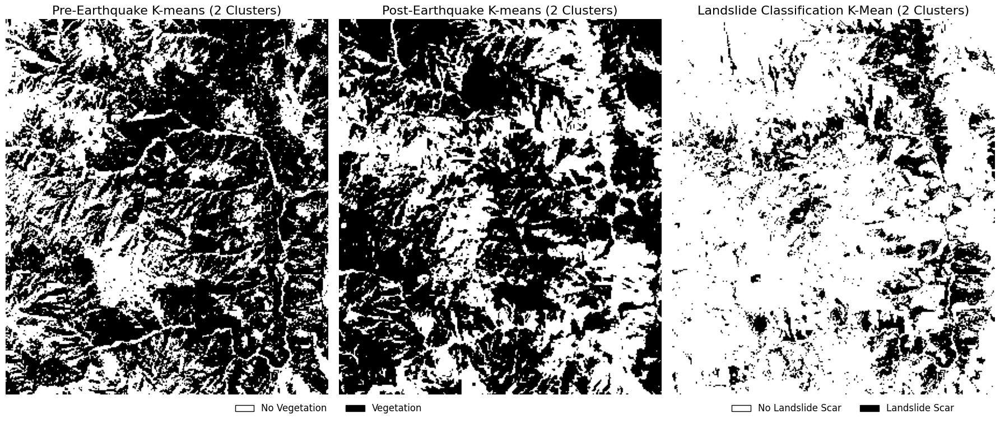

In [11]:
# --- Create Legend for Binary Cluster Labels ---
patches = [
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0), edgecolor='black'),
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0.99), edgecolor='black'),
]
labels = ['No Vegetation', 'Vegetation']

scar_patches = [
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0), edgecolor='black'),
    Rectangle((0, 0), 1, 1, facecolor='black', edgecolor='black')
]
scar_labels = ['No Landslide Scar', 'Landslide Scar']

# --- Plotting Side-by-Side Result with Shared Legend ---
fig, axes = plt.subplots(1, 3, figsize=(18, 7))

axes[0].imshow(labels_image_pre, cmap='binary')
axes[0].set_title('Pre-Earthquake K-means (2 Clusters)', fontsize = 16)
axes[0].axis('off')

axes[1].imshow(labels_image_post, cmap='binary')
axes[1].set_title('Post-Earthquake K-means (2 Clusters)', fontsize = 16)
axes[1].axis('off')

axes[2].imshow(landslide_mask_kmeans_2_cluster, cmap='binary')
axes[2].set_title('Landslide Classification K-Mean (2 Clusters)', fontsize = 16)
axes[2].axis('off')

# --- Add Legend Below First Two Plots ---
fig.legend(
    handles=patches,
    labels=labels,
    loc='lower center',
    ncol=2,
    bbox_to_anchor=(0.33, -0.05),
    prop={'size': 12},
    frameon=False
)

# --- Add Landslide Scar Legend under the Third Plot ---
fig.legend(
    handles=scar_patches,
    labels=scar_labels,
    loc='lower center',
    bbox_to_anchor=(0.84, -0.05),  # Positioned under third plot
    ncol=2,
    prop={'size': 12},
    frameon=False
)

plt.tight_layout()
plt.subplots_adjust(bottom=0.02)
#plt.savefig(path + 'Figure/kmeans_2_cluster.jpg', dpi=300, bbox_inches='tight')
plt.show()

## K-Means Clustering - 3 Clusters

Since the angle of sunlight reflection may affect the reflectance of each band, the second method uses K-Means clustering with three clusters to minimise the misclassification of vegetation with varying reflectance as bare soil. The clustering results before and after the earthquake were then compared to identify the landslide scar.

In [12]:
# --- Apply K-means on Pre-Earthquake Image ---
kmeans_pre = KMeans(n_clusters=3, random_state=24095819).fit(Pre_EQ_X)
labels_pre = kmeans_pre.labels_

# --- Create Label Image for Pre-Earthquake ---
labels_image_pre = np.full(band_stack_pre.shape[:2], -1, dtype=int)
labels_image_pre[valid_pre_mask] = labels_pre

# --- Apply K-means on Post-Earthquake Image ---
kmeans_post = KMeans(n_clusters=3, random_state=24095819).fit(Post_EQ_X)
labels_post = kmeans_post.labels_

# --- Create Label Image for Post-Earthquake ---
labels_image_post = np.full(band_stack_post.shape[:2], -1, dtype=int)
labels_image_post[valid_post_mask] = labels_post

# --- Reassign Labels in Pre-Earthquake Image ---
labels_image_pre[labels_image_pre == 0] = -10  # temp value to avoid collision
labels_image_pre[labels_image_pre == 2] = 0
labels_image_pre[labels_image_pre == -10] = 2

# --- Reassign Labels in Post-Earthquake Image for Consistency ---
labels_image_post[labels_image_post == 0] = -10
labels_image_post[labels_image_post == 2] = 0
labels_image_post[labels_image_post == -10] = 2

# --- Landslide mask: vegetation lost ---
landslide_mask_kmeans_3_cluster = (((labels_image_pre == 2) | (labels_image_pre == 1)) & (labels_image_post == 0)).astype(np.uint8)

Plot the K-Means results and the corresponding landslide scar.

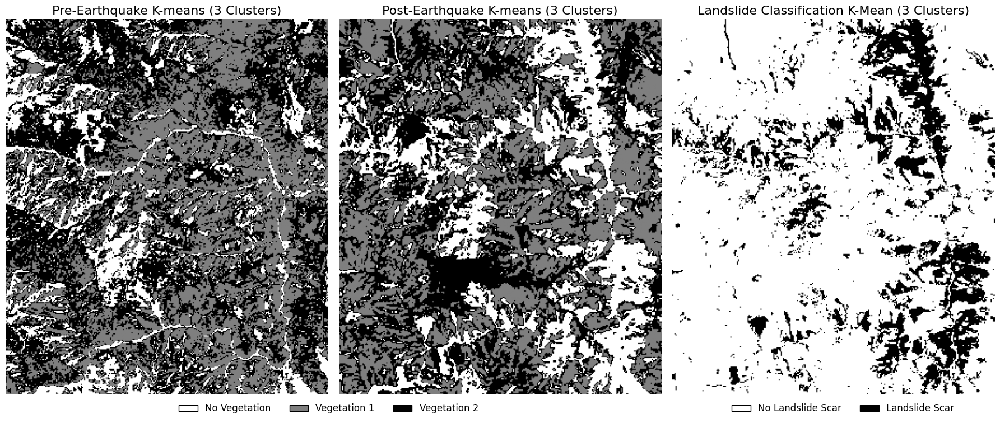

In [13]:
# --- Create Legend for Binary Cluster Labels ---
patches = [
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0), edgecolor='black'),
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0.5), edgecolor='black'),
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0.99), edgecolor='black'),
]
labels = ['No Vegetation', 'Vegetation 1', 'Vegetation 2']

scar_patches = [
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0), edgecolor='black'),
    Rectangle((0, 0), 1, 1, facecolor='black', edgecolor='black')
]
scar_labels = ['No Landslide Scar', 'Landslide Scar']

# --- Plotting Side-by-Side Result with Shared Legend ---
fig, axes = plt.subplots(1, 3, figsize=(18, 7))

axes[0].imshow(labels_image_pre, cmap='binary')
axes[0].set_title('Pre-Earthquake K-means (3 Clusters)', fontsize = 16)
axes[0].axis('off')

axes[1].imshow(labels_image_post, cmap='binary')
axes[1].set_title('Post-Earthquake K-means (3 Clusters)', fontsize = 16)
axes[1].axis('off')

axes[2].imshow(landslide_mask_kmeans_3_cluster, cmap='binary')
axes[2].set_title('Landslide Classification K-Mean (3 Clusters)', fontsize = 16)
axes[2].axis('off')

# --- Add Legend Below First Two Plots ---
fig.legend(
    handles=patches,
    labels=labels,
    loc='lower center',
    ncol=3,
    bbox_to_anchor=(0.33, -0.05),
    prop={'size': 12},
    frameon=False
)

# --- Add Landslide Scar Legend under the Third Plot ---
fig.legend(
    handles=scar_patches,
    labels=scar_labels,
    loc='lower center',
    bbox_to_anchor=(0.84, -0.05),  # Positioned under third plot
    ncol=2,
    prop={'size': 12},
    frameon=False
)

plt.tight_layout()
plt.subplots_adjust(bottom=0.02)
#plt.savefig(path + 'Figure/kmeans_3_cluster.jpg', dpi=300, bbox_inches='tight')
plt.show()

## Gaussian Mixture Model - 2 Components

The third method uses another unsupervised learning approach, the Gaussian Mixture Model (GMM), to distinguish vegetation from bare soil. Unlike K-Means, GMM allows soft clustering and more flexible cluster shapes, which may improve the separation of mixed land cover types and reduce misclassification. In this section, GMM was applied with two components to distinguish soil and vegetation.

In [14]:
# --- Apply GMM on Pre-Earthquake Data ---
gmm_pre = GaussianMixture(n_components=2, random_state=24095819).fit(Pre_EQ_X)
labels_pre_gmm = gmm_pre.predict(Pre_EQ_X)

# --- Create Label Image for Pre-Earthquake ---
labels_image_pre_gmm = np.full(band_stack_pre.shape[:2], -1, dtype=int)
labels_image_pre_gmm[valid_pre_mask] = labels_pre_gmm

# --- Apply GMM on Post-Earthquake Data ---
gmm_post = GaussianMixture(n_components=2, random_state=24095819).fit(Post_EQ_X)
labels_post_gmm = gmm_post.predict(Post_EQ_X)

# --- Create Label Image for Post-Earthquake ---
labels_image_post_gmm = np.full(band_stack_post.shape[:2], -1, dtype=int)
labels_image_post_gmm[valid_post_mask] = labels_post_gmm

# --- Landslide mask: vegetation lost ---
landslide_mask_gmm_2_component = ((labels_image_pre_gmm == 1) & (labels_image_post_gmm == 0)).astype(np.uint8)

Plot the GMM results and the corresponding landslide scar.

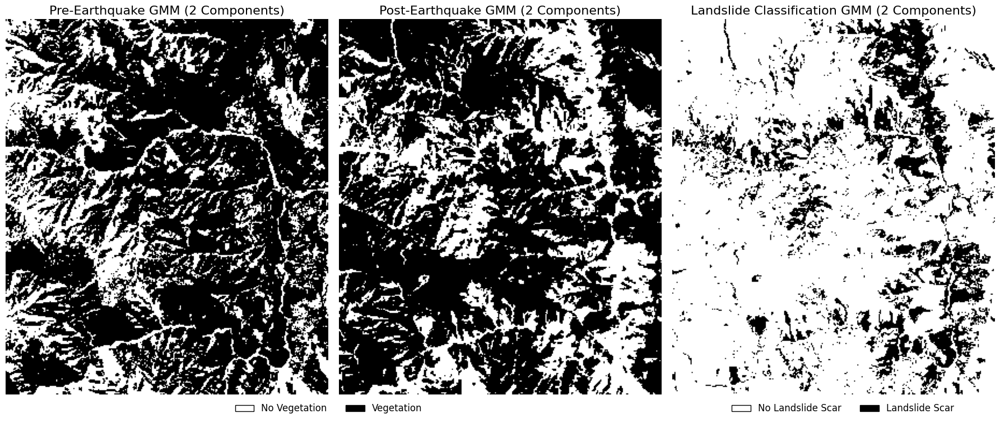

In [15]:
# --- Create Legend for Binary Cluster Labels ---
patches = [
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0), edgecolor='black'),
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0.99), edgecolor='black'),
]
labels = ['No Vegetation', 'Vegetation']

scar_patches = [
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0), edgecolor='black'),
    Rectangle((0, 0), 1, 1, facecolor='black', edgecolor='black')
]
scar_labels = ['No Landslide Scar', 'Landslide Scar']

# --- Plotting Side-by-Side Result with Shared Legend ---
fig, axes = plt.subplots(1, 3, figsize=(18, 7))

axes[0].imshow(labels_image_pre_gmm, cmap='binary')
axes[0].set_title('Pre-Earthquake GMM (2 Components)', fontsize = 16)
axes[0].axis('off')

axes[1].imshow(labels_image_post_gmm, cmap='binary')
axes[1].set_title('Post-Earthquake GMM (2 Components)', fontsize = 16)
axes[1].axis('off')

axes[2].imshow(landslide_mask_gmm_2_component, cmap='binary')
axes[2].set_title('Landslide Classification GMM (2 Components)', fontsize = 16)
axes[2].axis('off')

# --- Add Legend Below First Two Plots ---
fig.legend(
    handles=patches,
    labels=labels,
    loc='lower center',
    ncol=2,
    bbox_to_anchor=(0.33, -0.05),
    prop={'size': 12},
    frameon=False
)

# --- Add Landslide Scar Legend under the Third Plot ---
fig.legend(
    handles=scar_patches,
    labels=scar_labels,
    loc='lower center',
    bbox_to_anchor=(0.84, -0.05),  # Positioned under third plot
    ncol=2,
    prop={'size': 12},
    frameon=False
)

plt.tight_layout()
plt.subplots_adjust(bottom=0.02)
#plt.savefig(path + 'Figure/gmm_2_component.jpg', dpi=300, bbox_inches='tight')
plt.show()

## Gaussian Mixture Model - 3 Components

Similar to K-Means, the fourth method used GMM with three components instead of two to allow a greater margin of error in distinguishing soil and vegetation.

In [16]:
# --- Apply GMM on Pre-Earthquake Data ---
gmm_pre = GaussianMixture(n_components=3, random_state=24095819).fit(Pre_EQ_X)
labels_pre_gmm = gmm_pre.predict(Pre_EQ_X)

# --- Create Label Image for Pre-Earthquake ---
labels_image_pre_gmm = np.full(band_stack_pre.shape[:2], -1, dtype=int)
labels_image_pre_gmm[valid_pre_mask] = labels_pre_gmm

# --- Apply GMM on Post-Earthquake Data ---
gmm_post = GaussianMixture(n_components=3, random_state=24095819).fit(Post_EQ_X)
labels_post_gmm = gmm_post.predict(Post_EQ_X)

# --- Create Label Image for Post-Earthquake ---
labels_image_post_gmm = np.full(band_stack_post.shape[:2], -1, dtype=int)
labels_image_post_gmm[valid_post_mask] = labels_post_gmm

# --- Reassign Labels in Pre-Earthquake Image ---
labels_image_pre_gmm[labels_image_pre_gmm == 0] = -10  # temp value to avoid collision
labels_image_pre_gmm[labels_image_pre_gmm == 2] = 0
labels_image_pre_gmm[labels_image_pre_gmm == -10] = 2

# --- Reassign Labels in Post-Earthquake Image for Consistency ---
labels_image_post_gmm = labels_image_post_gmm.copy()
labels_image_post_gmm[labels_image_post_gmm == 0] = -10
labels_image_post_gmm[labels_image_post_gmm == 2] = 0
labels_image_post_gmm[labels_image_post_gmm == -10] = 2

# --- Landslide mask: vegetation lost ---
landslide_mask_gmm_3_component = (((labels_image_pre_gmm == 2) | (labels_image_pre_gmm == 1)) & (labels_image_post_gmm == 0)).astype(np.uint8)

Plot the GMM results and the corresponding landslide scar.

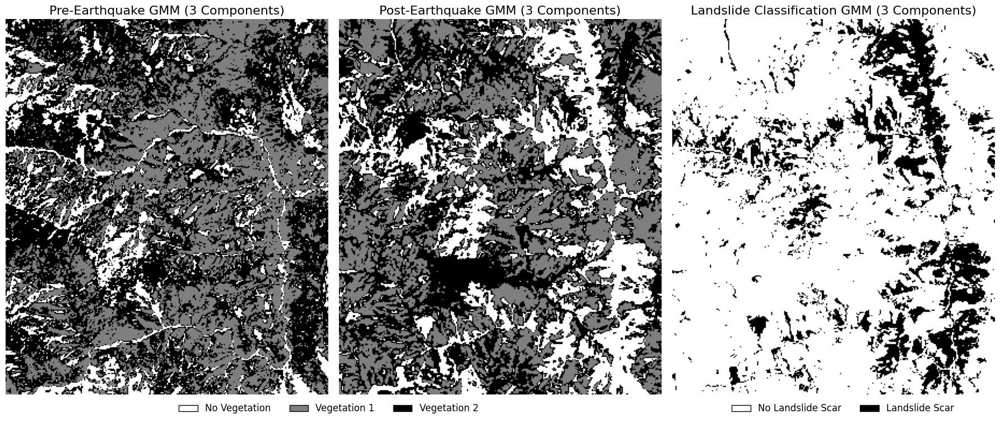

In [17]:
# --- Create Legend for Binary Cluster Labels ---
patches = [
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0), edgecolor='black'),
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0.5), edgecolor='black'),
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0.99), edgecolor='black'),
]
labels = ['No Vegetation', 'Vegetation 1', 'Vegetation 2']

scar_patches = [
    Rectangle((0, 0), 1, 1, facecolor=plt.cm.binary(0), edgecolor='black'),
    Rectangle((0, 0), 1, 1, facecolor='black', edgecolor='black')
]
scar_labels = ['No Landslide Scar', 'Landslide Scar']

# --- Plotting Side-by-Side Result with Shared Legend ---
fig, axes = plt.subplots(1, 3, figsize=(18, 7))

axes[0].imshow(labels_image_pre_gmm, cmap='binary')
axes[0].set_title('Pre-Earthquake GMM (3 Components)', fontsize = 16)
axes[0].axis('off')

axes[1].imshow(labels_image_post_gmm, cmap='binary')
axes[1].set_title('Post-Earthquake GMM (3 Components)', fontsize = 16)
axes[1].axis('off')

axes[2].imshow(landslide_mask_gmm_3_component, cmap='binary')
axes[2].set_title('Landslide Classification GMM (3 Components)', fontsize = 16)
axes[2].axis('off')

# --- Add Legend Below First Two Plots ---
fig.legend(
    handles=patches,
    labels=labels,
    loc='lower center',
    ncol=3,
    bbox_to_anchor=(0.33, -0.05),
    prop={'size': 12},
    frameon=False
)

# --- Add Landslide Scar Legend under the Third Plot ---
fig.legend(
    handles=scar_patches,
    labels=scar_labels,
    loc='lower center',
    bbox_to_anchor=(0.84, -0.05),  # Positioned under third plot
    ncol=2,
    prop={'size': 12},
    frameon=False
)

plt.tight_layout()
plt.subplots_adjust(bottom=0.02)
#plt.savefig(path + 'Figure/gmm_3_component.jpg', dpi=300, bbox_inches='tight')
plt.show()

## Performance Analysis
**To analyse the performance of the four models, the NDVI-derived landslide mask was used as a reference to evaluate the classification results from K-Means and Gaussian Mixture Model (GMM) methods. Confusion matrices were computed to assess the agreement between predictions and the reference, and accuracy scores were calculated for overall performance. In addition, precision, recall, and F1 scores were obtained through classification reports to provide a more detailed evaluation of each method's effectiveness in identifying landslide scars. Finally, all the predicted masks were overlaid on the post-earthquake true-colour image to offer a visual comparison of detection performance.**

Compute the performance metrics.

In [18]:
# --- Define Ground Truth and Predicted Masks for Evaluation ---
landslide_mask_ndvi = landslide_mask  # NDVI-based scar used as reference

kmeans_2_cluster_result = landslide_mask_kmeans_2_cluster  # Binary mask from K-means (2 clusters)
kmeans_3_cluster_result = landslide_mask_kmeans_3_cluster  # Binary mask from K-means (3 clusters)
gmm_2_component_result = landslide_mask_gmm_2_component    # Binary mask from GMM (2 components)
gmm_3_component_result = landslide_mask_gmm_3_component    # Binary mask from GMM (3 components)

# --- Flatten the 2D Masks for Evaluation ---
ndvi_baseline = landslide_mask_ndvi.flatten()                  # Ground truth
kmeans_2_cluster_pred = kmeans_2_cluster_result.flatten()
kmeans_3_cluster_pred = kmeans_3_cluster_result.flatten()
gmm_2_component_pred = gmm_2_component_result.flatten()
gmm_3_component_pred = gmm_3_component_result.flatten()

# --- Compute Confusion Matrices ---
cm_2_cluster_kmeans = confusion_matrix(ndvi_baseline, kmeans_2_cluster_pred)
cm_3_cluster_kmeans = confusion_matrix(ndvi_baseline, kmeans_3_cluster_pred)
cm_2_component_gmm = confusion_matrix(ndvi_baseline, gmm_2_component_pred)
cm_3_component_gmm = confusion_matrix(ndvi_baseline, gmm_3_component_pred)

# --- Calculate Overall Accuracy ---
accuracy_2_cluster_kmeans = accuracy_score(ndvi_baseline, kmeans_2_cluster_pred)
accuracy_3_cluster_kmeans = accuracy_score(ndvi_baseline, kmeans_3_cluster_pred)
accuracy_2_component_gmm = accuracy_score(ndvi_baseline, gmm_2_component_pred)
accuracy_3_component_gmm = accuracy_score(ndvi_baseline, gmm_3_component_pred)

# --- Generate Detailed Classification Reports (Precision, Recall, F1) ---
report_2_cluster_kmeans = classification_report(ndvi_baseline, kmeans_2_cluster_pred)
report_3_cluster_kmeans = classification_report(ndvi_baseline, kmeans_3_cluster_pred)
report_2_component_gmm = classification_report(ndvi_baseline, gmm_2_component_pred)
report_3_component_gmm = classification_report(ndvi_baseline, gmm_3_component_pred)

# --- Print Classification Reports ---
print("Classification Report for 2-Clusters K-Means:\n", report_2_cluster_kmeans)
print("Classification Report for 3-Clusters K-Means:\n", report_3_cluster_kmeans)
print("Classification Report for 2-Components GMM:\n", report_2_component_gmm)
print("Classification Report for 3-Components GMM:\n", report_3_component_gmm)

# --- Print Accuracy Scores ---
print(f"Accuracy for 2-Clusters K-Means: {accuracy_2_cluster_kmeans:.5f}")
print(f"Accuracy for 3-Clusters K-Means: {accuracy_3_cluster_kmeans:.5f}")
print(f"Accuracy for 2-Components GMM: {accuracy_2_component_gmm:.5f}")
print(f"Accuracy for 3-Components GMM: {accuracy_3_component_gmm:.5f}")

Classification Report for 2-Clusters K-Means:
               precision    recall  f1-score   support

           0       0.93      0.97      0.95     80231
           1       0.90      0.75      0.82     24769

    accuracy                           0.92    105000
   macro avg       0.91      0.86      0.88    105000
weighted avg       0.92      0.92      0.92    105000

Classification Report for 3-Clusters K-Means:
               precision    recall  f1-score   support

           0       0.92      0.99      0.95     80231
           1       0.94      0.71      0.81     24769

    accuracy                           0.92    105000
   macro avg       0.93      0.85      0.88    105000
weighted avg       0.92      0.92      0.92    105000

Classification Report for 2-Components GMM:
               precision    recall  f1-score   support

           0       0.92      0.98      0.95     80231
           1       0.93      0.71      0.80     24769

    accuracy                           0.92

Plot the confusion matrices of all the models.

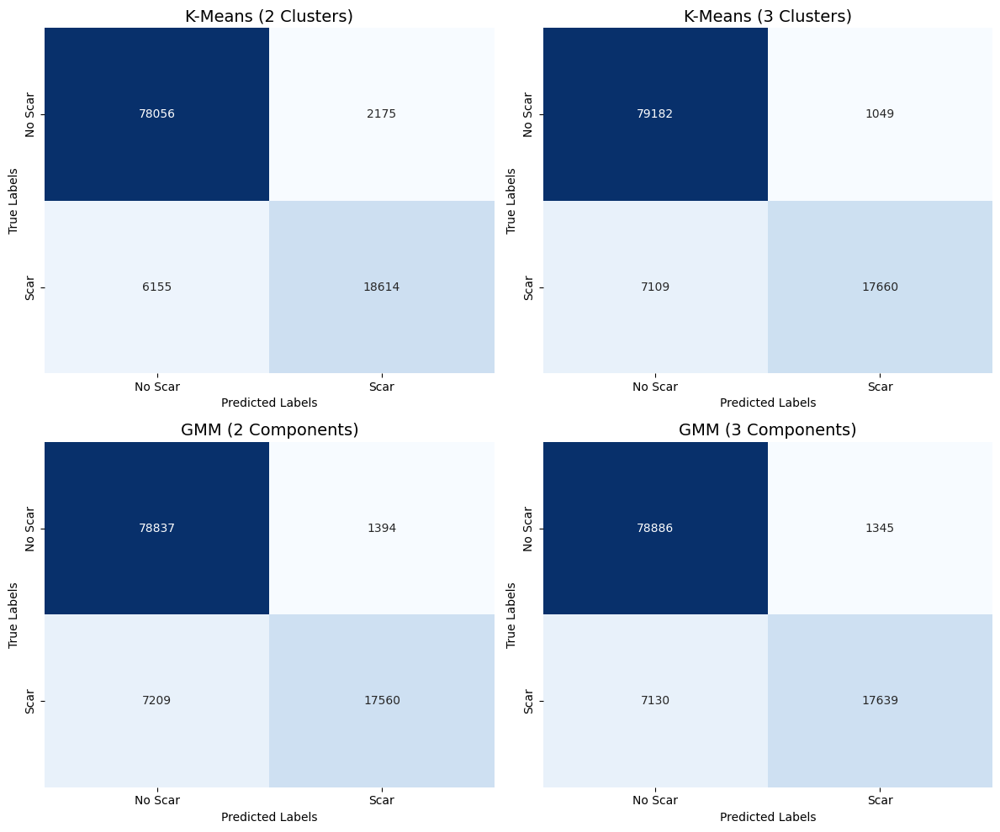

In [19]:
# --- Labels for axis ---
labels = ["No Scar", "Scar"]

# --- Set up the figure and axes ---
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# --- Plot each confusion matrix ---
sns.heatmap(cm_2_cluster_kmeans, annot=True, fmt="d", cmap="Blues",
            xticklabels=labels, yticklabels=labels, cbar=False, ax=axes[0, 0])
axes[0, 0].set_title("K-Means (2 Clusters)", fontsize = 14)
axes[0, 0].set_xlabel("Predicted Labels")
axes[0, 0].set_ylabel("True Labels")

sns.heatmap(cm_3_cluster_kmeans, annot=True, fmt="d", cmap="Blues",
            xticklabels=labels, yticklabels=labels, cbar=False, ax=axes[0, 1])
axes[0, 1].set_title("K-Means (3 Clusters)", fontsize = 14)
axes[0, 1].set_xlabel("Predicted Labels")
axes[0, 1].set_ylabel("True Labels")

sns.heatmap(cm_2_component_gmm, annot=True, fmt="d", cmap="Blues",
            xticklabels=labels, yticklabels=labels, cbar=False, ax=axes[1, 0])
axes[1, 0].set_title("GMM (2 Components)", fontsize = 14)
axes[1, 0].set_xlabel("Predicted Labels")
axes[1, 0].set_ylabel("True Labels")

sns.heatmap(cm_3_component_gmm, annot=True, fmt="d", cmap="Blues",
            xticklabels=labels, yticklabels=labels, cbar=False, ax=axes[1, 1])
axes[1, 1].set_title("GMM (3 Components)", fontsize = 14)
axes[1, 1].set_xlabel("Predicted Labels")
axes[1, 1].set_ylabel("True Labels")

# --- Adjust layout ---
plt.tight_layout()
#plt.savefig(path + 'Figure/all_confusion_matrix.jpg', dpi=300, bbox_inches='tight')
plt.show()

Visualise all predicted masks and the NDVI-based reference by overlaying them on the post-earthquake true-colour image.

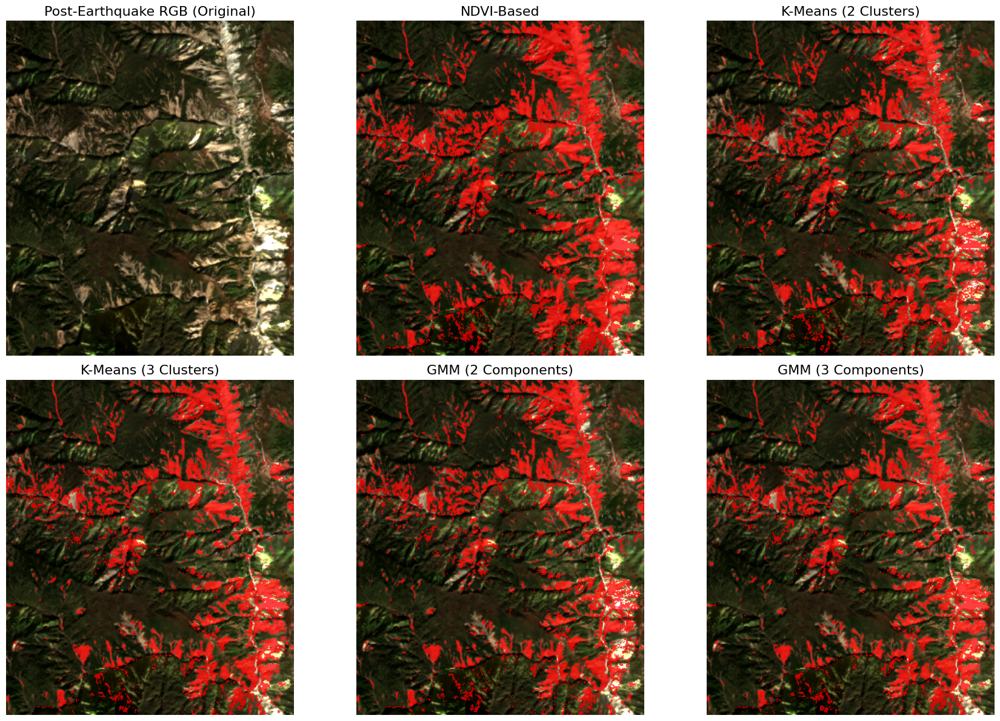

In [20]:
# --- List of masks and titles ---
masks = [
    (None, "Post-Earthquake RGB (Original)"),
    (landslide_mask_ndvi, "NDVI-Based"),
    (landslide_mask_kmeans_2_cluster, "K-Means (2 Clusters)"),
    (landslide_mask_kmeans_3_cluster, "K-Means (3 Clusters)"),
    (landslide_mask_gmm_2_component, "GMM (2 Components)"),
    (landslide_mask_gmm_3_component, "GMM (3 Components)")
]

# --- Create subplot grid ---
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# --- Alpha value for blending ---
alpha = 0.75  # 0 = no red, 1 = solid red

# --- Loop through each image ---
for i, (mask, title) in enumerate(masks):
    if mask is None:
        # Show original RGB image without overlay
        image_to_show = rgb_aligned
    else:
        # Blend red only on scar areas
        overlay = rgb_aligned.copy()
        red_mask = mask == 1
        red_overlay = np.array([1.0, 0.0, 0.0], dtype=np.float32)  # red

        # Apply alpha blending only on red_mask pixels
        overlay[red_mask] = (
            (1 - alpha) * overlay[red_mask] + alpha * red_overlay
        )

        image_to_show = overlay

    axes[i].imshow(image_to_show)
    axes[i].set_title(title, fontsize = 16)
    axes[i].axis('off')

plt.tight_layout()
#plt.savefig(path + 'Figure/all_mask_overlay.jpg', dpi=300, bbox_inches='tight')
plt.show()

## Conclusion

The model results show that, in terms of distinguishing vegetation and bare soil, using three clusters for K-means and three components for GMM yields significantly better performance. However, when comparing the pre- and post-earthquake classifications for landslide scar detection, all models perform similarly, each achieving an accuracy score above 0.9. This high level of accuracy suggests that unsupervised learning could be a viable approach for rapidly and reliably detecting landslide scars without requiring prior knowledge of local vegetation characteristics, as is needed in traditional threshold-based methods. Therefore, the number of clusters or components can be selected based on the specific objective of the study: for landslide scar detection using multi-temporal imagery, two clusters or components are sufficient; for distinguishing vegetation and bare soil from a single-date image, three clusters or components are recommended to improve classification accuracy.


## Environmental Cost Assessment

In [22]:
emissions = tracker.stop()
print(f"Estimated CO2 emissions: {emissions:.6f} kg")

[codecarbon INFO @ 14:45:18] Energy consumed for RAM : 0.001719 kWh. RAM Power : 10.0 W
[codecarbon INFO @ 14:45:18] Delta energy consumed for CPU with constant : 0.000049 kWh, power : 42.5 W
[codecarbon INFO @ 14:45:18] Energy consumed for All CPU : 0.007309 kWh
[codecarbon INFO @ 14:45:18] 0.009029 kWh of electricity used since the beginning.


Estimated CO2 emissions: 0.005800 kg
